### Independent Component Analysis

This activity will showcase the power of Independent Component Analysis to uncover the underlying signals that generate a mixture of non-Gaussian signals. We will solve the original Coktail Party Problem by separating the audio from two sources recoded at a party at my house earlier this week.

In [44]:
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
from scipy.io import wavfile
from scipy import linalg
import librosa.display
from sklearn.decomposition import FastICA, PCA

%matplotlib inline
import matplotlib.pyplot as plt


Music is Royalty Free, from https://freesound.org/people/Greek555/packs/14826/.

In [85]:
import IPython.display as ipd
ipd.Audio('data/all.wav') # all sources combined

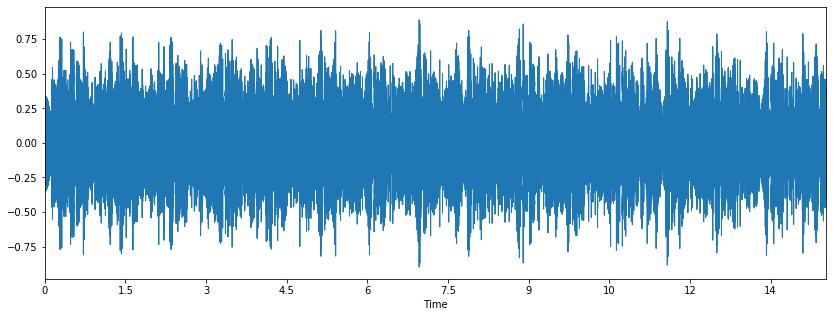

In [86]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/all.wav')
librosa.display.waveplot(x, sr=sr)

In [89]:
ipd.Audio('data/message.wav') # source 1

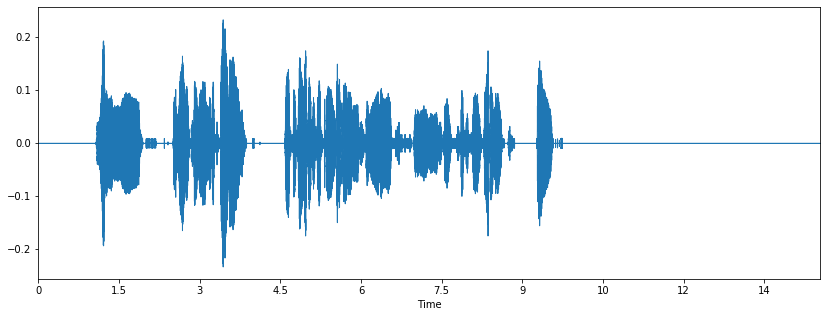

In [90]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/message.wav')
librosa.display.waveplot(x, sr=sr)

In [ ]:
ipd.Audio('data/melody.wav') # source 2

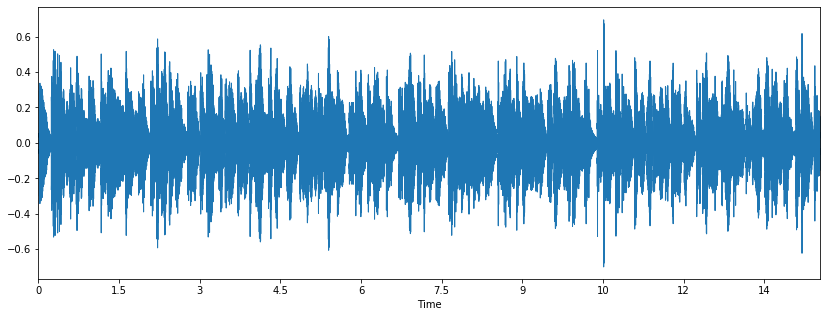

In [91]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/melody.wav')
librosa.display.waveplot(x, sr=sr)

In [92]:
ipd.Audio('data/base.wav') # source 3

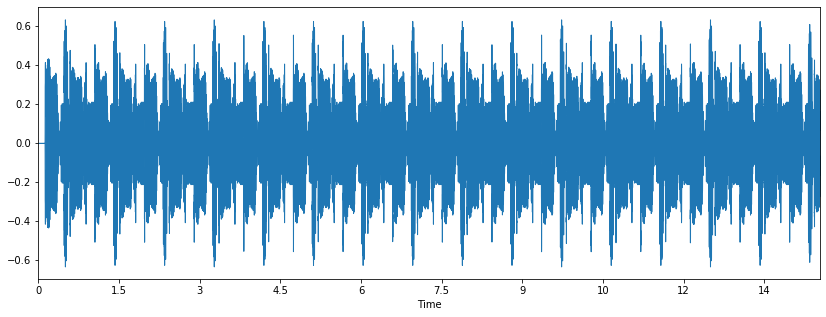

In [93]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/base.wav')
librosa.display.waveplot(x, sr=sr)

/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: WavFileWarning: Chunk (non-data) not understood, skipping it.
  after removing the cwd from sys.path.
/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: WavFileWarning: Chunk (non-data) not understood, skipping it.
  """
/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  import sys
/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  if __name__ == '__main__':
/Users/david/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: W

Sampling rate:  44100
Dimensions:  (640919, 4)


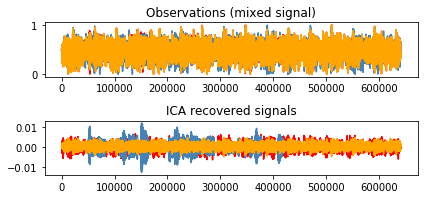

In [165]:
### Based on code from: https://scikit-learn.org/stable/auto_examples/decomposition/plot_ica_blind_source_separation.html

# Input the data from the first receiver.
sr, sa = wavfile.read('data/all.wav')
sr, sb = wavfile.read('data/base+melody.wav')
sr, sc = wavfile.read('data/melody+message.wav')
sr, sd = wavfile.read('data/base+message.wav')

# We will decompose the combined signal
sa = sa.astype('float64')
sb = sb.astype('float64')
sc = sc.astype('float64')
sd = sd.astype('float64')
X = np.c_[sa, sb]
# Convert the signal so that amplitude lies between 0 and 1.
# uint8 takes values from 0 through 255; sound signals are oscillatory
X /= 255.0 - 0.5

print ("Sampling rate: ", sr)
print ("Dimensions: ", X.shape)

# Compute ICA
ica = FastICA(n_components=3)
S_ = ica.fit_transform(X)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

# #############################################################################
# Plot results

plt.figure()

models = [X, S_]
names = ['Observations (mixed signal)',
         'ICA recovered signals']
colors = ['red', 'steelblue', 'orange']

for ii, (model, name) in enumerate(zip(models, names), 1):
    plt.subplot(3, 1, ii)
    plt.title(name)
    for sig, color in zip(model.T, colors):
        plt.plot(sig, color=color)

plt.tight_layout()
plt.show()

In [168]:
# write output audio files
S = S_ * 100
wavfile.write('data/out1.wav', sr, np.transpose(S[:,0]))
wavfile.write('data/out2.wav', sr, np.transpose(S[:,1]))
wavfile.write('data/out3.wav', sr, np.transpose(S[:,2]))

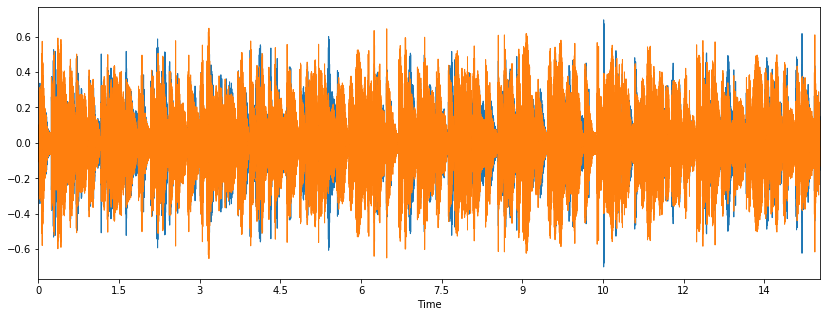

In [179]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/melody.wav')
librosa.display.waveplot(x, sr=sr)
librosa.display.waveplot(S[:,0], sr=sr*2)
# recovered melody
ipd.Audio(S[:,0], rate=sr*2) 

In [180]:
# original melody
ipd.Audio('data/melody.wav') 

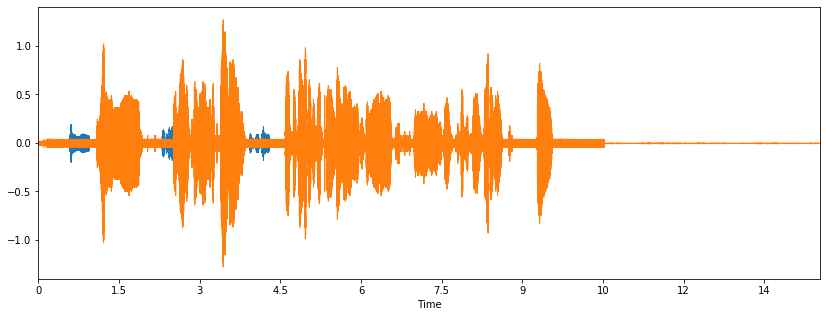

In [183]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/message.wav')
librosa.display.waveplot(x, sr=sr*2)
librosa.display.waveplot(S[:,1], sr=sr*2)
# recovered message
ipd.Audio(S[:,1], rate=sr*2) 

In [184]:
# original message
ipd.Audio('data/message.wav') 

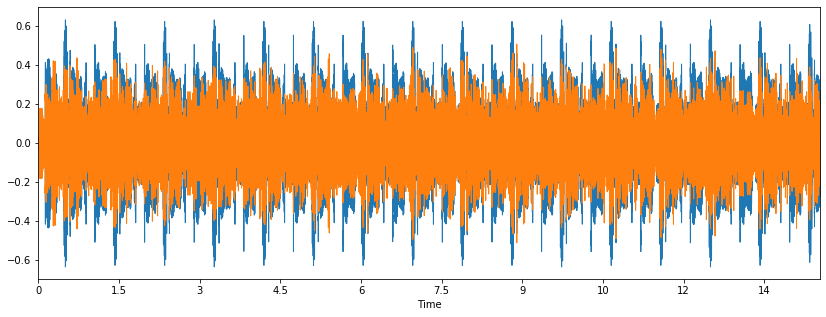

In [186]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('data/base.wav')
librosa.display.waveplot(x, sr=sr)
librosa.display.waveplot(S[:,2], sr=sr*2)
# recovered base
ipd.Audio(S[:,2], rate=sr*2) 

In [187]:
# original message
ipd.Audio('data/base.wav') 

In [173]:
A_

array([[ 46.12867299, -10.41015679, -90.97429636],
       [-39.26295904, -10.49837401, -91.96244624],
       [ 46.1708894 ,  -0.8400123 , -91.03524772],
       [-39.22204524,  -0.92927809, -92.02606755]])